In [98]:
#Charger les données
import csv
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import io
import re
import seaborn as sns
import sqlite3
from IPython.core.display import HTML
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier

from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn import metrics

from sklearn.tree import export_graphviz
from io import StringIO 
from IPython.display import Image  
import pydotplus

from datetime import datetime

def load_data():
    # Demander à l'utilisateur de fournir le chemin du fichier unique
    file_path = input("Veuillez entrer le chemin du fichier unique : ")

     # Déterminer le type de fichier et charger les données en conséquence
    if file_path.endswith('.csv'):
        data = pd.read_csv(file_path, header=None)
        data.columns = data.iloc[0]
        data = data[1:].reset_index(drop=True)
    elif file_path.endswith('.db'):
        conn = sqlite3.connect(file_path)
        query = "SELECT name FROM sqlite_master WHERE type='table' AND name NOT LIKE 'sqlite_%';"
        tables = pd.read_sql(query, conn)

        if tables.empty:
            conn.close()
            raise ValueError("No tables found in the database.")
        
        table_names = tables['name'].tolist()
        # Check columns in each table
        for table_name in table_names:
            data = pd.read_sql(f"SELECT * FROM {table_name}", conn)
            
        conn.close()
    else:
        raise ValueError("Format de fichier non conforme (.csv ou .db)")

    # Vérifications et modifications conditionnelles
    if 'lastOnlineDate' in data.columns:
        data['lastOnlineDate'] = pd.to_datetime(data['lastOnlineDate'], format='%Y-%m-%dT%H:%M:%SZ')
        data['lastOnlineDate'] = data['lastOnlineDate'].dt.strftime("%Y-%m-%d %H:%M:%S")

    if 'counts_details' in data.columns:
        data['counts_details'] = pd.to_numeric(data['counts_details'], errors='coerce').round(2)
    
    if 'genderLooking' in data.columns:
        replacement_dict = {'M': 1, 'F': 2, 'both': 3, 'none': 0}
        data['genderLooking'] = data['genderLooking'].replace(replacement_dict)
    
    if 'freetext' in data.columns:
        data['freetext'] = data['freetext'].apply(lambda x: 'false' if pd.isna(x) or x == '' else 'true')
    
    # Vérifier les colonnes et appliquer les remplacements
    bool_columns = ['isFlirtstar', 'isNew', 'birthd', 'isMobile', 'isOnline', 'isVip', 'verified', 'isHighlighted', 'isSystemProfile', 'shareProfileEnabled']
    for column in bool_columns:
        if column in data.columns:
            data[column] = data[column].replace({'1': 'true', '0': 'false'})
    
    # Renommer les colonnes
    rename_dict = {
        'isVip': 'isVIP', 'lastOnlineDate': 'lastOnline',
        'lastOnlineTime': 'lastOnlineTs', 'location': 'locationCity',
        'counts_details': 'countDetails', 'isFlirtstar': 'flirtstar',
        'isHighlighted': 'highlighted', 'verified': 'isVerified',
        'isNew': 'freshman', 'birthd': 'hasBirthday', 'isMobile': 'mobile',
        'isOnline': 'online'
    }
    data.rename(columns={k: v for k, v in rename_dict.items() if k in data.columns}, inplace=True)

    # Enregistrer les données traitées dans un nouveau fichier CSV
    #data.to_csv('processed_data.csv', index=False, header=True)

    return data

# Charger les données
dataset = load_data()

# Ajuster les paramètres d'affichage de pandas pour afficher toutes les colonnes
pd.set_option('display.max_columns', None)

# Afficher un aperçu des données
display(HTML(dataset.to_html()))

print(dataset.columns)


C:\Users\NG20\AppData\Local\Temp\ipykernel_7632\2785703028.py:63: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  data['genderLooking'] = data['genderLooking'].replace(replacement_dict)


,gender,genderLooking,age,name,countDetails,counts_pictures,counts_profileVisits,counts_kisses,counts_fans,counts_g,flirtInterests_chat,flirtInterests_friends,flirtInterests_date,country,city,locationCity,distance,flirtstar,highlighted,isInfluencer,mobile,freshman,online,isVIP,lang_count,lang_fr,lang_en,lang_de,lang_it,lang_es,lang_pt,isVerified,shareProfileEnabled,lastOnline,lastOnlineTs,hasBirthday,crypt,freetext,whazzup,userId,pictureId,isSystemProfile
0,F,1,25,daeni,1.00,4,8279,239,0,3,true,true,true,CH,Rothenburg,Rümlang,175,false,false,0,true,false,false,false,1,false,false,true,false,false,false,false,true,2015-04-25 20:43:26,1429994606,false,NaN,true,Nur tote fische schwimmen mit dem strom,4e3842f79b70e7ea57000064,55303fc3160ba0eb728b4575,NaN
1,F,1,22,italiana 92,0.85,5,663,13,0,0,true,true,true,CH,Sissach,Sissach,138,false,false,0,true,false,false,false,3,true,false,true,true,false,false,false,true,2015-04-26 09:19:35,1430039975,false,NaN,false,Primaveraaa<3,4e3d34bf5d2bce7b160006a3,552e7b61c66da10d1e8b4c82,NaN
2,F,1,21,Lauraaa,0.00,4,1369,88,0,2,false,false,true,CH,Bâle,Bâle,137,false,false,0,false,false,true,false,0,false,false,false,false,false,false,false,true,2015-04-06 14:24:07,1428330247,false,NaN,false,NaN,4ec96c090dc82cb25d00000a,54a584ecc56da128638b4674,NaN
3,F,0,20,Qqkwmdowlo,0.12,3,22187,1015,2,3,true,true,false,CA,Montréal,Berne,77.3,false,false,0,false,false,false,false,2,true,true,false,false,false,false,false,true,2015-04-07 11:21:01,1428405661,false,NaN,false,Je pense donc je suis. Instagram quedev,4eef8b81ebf2c8f64000000c,54c92738076ea1b5338b4735,NaN
4,F,1,21,schaessie {3,0.15,12,35262,1413,9,12,true,false,false,DE,Rastatt,Rastatt,286,false,false,0,false,false,true,false,1,false,false,true,false,false,false,false,true,2015-04-06 14:25:20,1428330320,false,NaN,false,Instagram: JESSSIESCH,4ef3cc5aa9d0b3d07d000017,54e1a6f6c76da135748b4a3a,NaN
5,F,1,24,Baby dee,0.81,18,7339,180,0,2,true,false,true,DE,Titisee-Neustadt,Titisee-Neustadt,194,false,false,0,true,false,true,false,2,false,true,true,false,false,false,false,true,2015-04-08 14:37:51,1428503871,false,NaN,false,Wicked Wonderland💕❤️,4ef9434cca61bece6a000002,54f2b4ce0b6ea1177e8b4d18,NaN
6,F,0,24,Anna,0.65,13,18672,492,0,1,false,true,false,DE,Stuttgart,Stuttgart,318,false,false,0,true,false,true,false,5,false,true,true,false,false,false,false,true,2015-04-27 19:29:58,1430162998,false,NaN,false,💚 ✅ Instagram : anna_lem0n,4f10cbc1883fa97a5f000015,54ecbb39170ba08b488b4aa5,NaN
7,F,1,23,Feelinchen,0.81,6,19091,1348,0,20,true,false,true,DE,Eisenhüttenstadt,Bad Krozingen,175,false,false,0,true,false,false,false,2,false,true,true,false,false,false,false,false,2015-04-08 14:18:11,1428502691,false,NaN,false,🌸🗻🌸,4f317525883fa9636900000e,54fc1786170ba041758b4577,NaN
8,F,1,20,chantal,0.88,14,29984,2389,10,11,true,true,true,CH,Gstaad,Steffisburg,81.4,false,false,0,true,false,false,false,3,true,true,true,false,false,false,false,true,2015-04-07 20:01:55,1428436915,false,NaN,false,🙊🙉🙈,4f3516420c84d3dd23000001,550c8310066ea13f808b4b35,NaN
9,F,1,24,rina1990,0.81,1,5979,147,1,2,true,true,true,DE,Stuttgart,Stuttgart,315,false,false,0,false,false,true,false,2,false,true,true,false,false,false,false,true,2015-04-06 16:10:49,1428336649,false,NaN,false,:-),4fa0fb54883fa90e0d0005d6,53745af3150ba023158b4588,NaN


Index(['gender', 'genderLooking', 'age', 'name', 'countDetails',
       'counts_pictures', 'counts_profileVisits', 'counts_kisses',
       'counts_fans', 'counts_g', 'flirtInterests_chat',
       'flirtInterests_friends', 'flirtInterests_date', 'country', 'city',
       'locationCity', 'distance', 'flirtstar', 'highlighted', 'isInfluencer',
       'mobile', 'freshman', 'online', 'isVIP', 'lang_count', 'lang_fr',
       'lang_en', 'lang_de', 'lang_it', 'lang_es', 'lang_pt', 'isVerified',
       'shareProfileEnabled', 'lastOnline', 'lastOnlineTs', 'hasBirthday',
       'crypt', 'freetext', 'whazzup', 'userId', 'pictureId',
       'isSystemProfile'],
      dtype='object', name=0)


In [99]:
pd.set_option('display.max_columns', None)
print(dataset.columns)

# Supprimer les lignes où les colonnes spécifiées ont la valeur True
columns_to_check = ['isSystemProfile']
for column in columns_to_check:
    if column in dataset.columns:
        print(f"Les lignes avec  {columns_to_check} 'true' ont été supprimées")
        dataset = dataset[dataset[column] != 'true']
 
       
columns_to_verif = ['distance', 'lastOnlineTs']        
for column in columns_to_verif:
    if column in dataset.columns:
        print(f"Les lignes avec des valeurs NaN ou vides dans la colonne '{column}' ont été supprimées.")
        dataset = dataset.dropna(subset=[column])


columns_to_remove = ['isSystemProfile', 'pictureId', 'crypt', 'city', 'locationCity', 'name', 'userId', 'gender', 'highlighted', 'lastOnline', 'country', 'isInfluencer']
# Vérifier si les colonnes existent dans le DataFrame avant de les retirer
for column in columns_to_remove:
    if column in dataset.columns:
        print(f"La colonne {column} a été supprimée")
        dataset = dataset.drop(columns=[column])

# dataset.drop('lastOnlineTs', axis=1, inplace=True)
# dataset.drop('distance', axis=1, inplace=True)
print(dataset.columns)


Index(['gender', 'genderLooking', 'age', 'name', 'countDetails',
       'counts_pictures', 'counts_profileVisits', 'counts_kisses',
       'counts_fans', 'counts_g', 'flirtInterests_chat',
       'flirtInterests_friends', 'flirtInterests_date', 'country', 'city',
       'locationCity', 'distance', 'flirtstar', 'highlighted', 'isInfluencer',
       'mobile', 'freshman', 'online', 'isVIP', 'lang_count', 'lang_fr',
       'lang_en', 'lang_de', 'lang_it', 'lang_es', 'lang_pt', 'isVerified',
       'shareProfileEnabled', 'lastOnline', 'lastOnlineTs', 'hasBirthday',
       'crypt', 'freetext', 'whazzup', 'userId', 'pictureId',
       'isSystemProfile'],
      dtype='object', name=0)
Les lignes avec  ['isSystemProfile'] 'true' ont été supprimées
Les lignes avec des valeurs NaN ou vides dans la colonne 'distance' ont été supprimées.
Les lignes avec des valeurs NaN ou vides dans la colonne 'lastOnlineTs' ont été supprimées.
La colonne isSystemProfile a été supprimée
La colonne pictureId a été s

In [100]:
#Normalisation des strings
# Fonction pour compter les emojis dans un texte
def count_emojis(text):
    emoji_pattern = re.compile(
        "["
        "\U0001F600-\U0001F64F"  # Emoticônes
        "\U0001F300-\U0001F5FF"  # Symboles & pictogrammes divers
        "\U0001F680-\U0001F6FF"  # Transport & symboles de cartes
        "\U0001F700-\U0001F77F"  # Alchimie
        "\U0001F780-\U0001F7FF"  # Géométrie supplémentaire
        "\U0001F800-\U0001F8FF"  # Suppléments divers
        "\U0001F900-\U0001F9FF"  # Suppléments divers & pictogrammes supplémentaires
        "\U0001FA00-\U0001FA6F"  # Suppléments divers & pictogrammes supplémentaires
        "\U0001FA70-\U0001FAFF"  # Suppléments divers & pictogrammes supplémentaires
        "\U00002702-\U000027B0"  # Divers symboles
        "\U000024C2-\U0001F251" 
        "]+", flags=re.UNICODE)
    emojis = emoji_pattern.findall(text)
    return len(emojis)

# Fonction pour compter la longueur du texte
def text_length(text):
    return len(text)

# Convertir les valeurs de la colonne 'whazzup' en chaînes de caractères
dataset['whazzup'] = dataset['whazzup'].astype(str)
# Appliquer la fonction count_emojis à chaque ligne de la colonne 'texte'
dataset['whazzupEmojiAmount'] = dataset['whazzup'].apply(count_emojis)

# Appliquer la fonction text_length à chaque ligne de la colonne 'texte'
dataset['whazzupLength'] = dataset['whazzup'].apply(text_length)
dataset.drop(['whazzup'], axis=1, inplace=True)
print(dataset.columns)


Index(['genderLooking', 'age', 'countDetails', 'counts_pictures',
       'counts_profileVisits', 'counts_kisses', 'counts_fans', 'counts_g',
       'flirtInterests_chat', 'flirtInterests_friends', 'flirtInterests_date',
       'distance', 'flirtstar', 'mobile', 'freshman', 'online', 'isVIP',
       'lang_count', 'lang_fr', 'lang_en', 'lang_de', 'lang_it', 'lang_es',
       'lang_pt', 'isVerified', 'shareProfileEnabled', 'lastOnlineTs',
       'hasBirthday', 'freetext', 'whazzupEmojiAmount', 'whazzupLength'],
      dtype='object', name=0)


In [101]:
#Définir la variable de popularité
dataset['is_popular'] = (pd.to_numeric(dataset['counts_profileVisits']) > 10) & (pd.to_numeric(dataset['counts_kisses']) / pd.to_numeric(dataset['counts_profileVisits']) > 0.05)

display(HTML(dataset.to_html()))


,genderLooking,age,countDetails,counts_pictures,counts_profileVisits,counts_kisses,counts_fans,counts_g,flirtInterests_chat,flirtInterests_friends,flirtInterests_date,distance,flirtstar,mobile,freshman,online,isVIP,lang_count,lang_fr,lang_en,lang_de,lang_it,lang_es,lang_pt,isVerified,shareProfileEnabled,lastOnlineTs,hasBirthday,freetext,whazzupEmojiAmount,whazzupLength,is_popular
0,1,25,1.00,4,8279,239,0,3,true,true,true,175,false,true,false,false,false,1,false,false,true,false,false,false,false,true,1429994606,false,true,0,39,False
1,1,22,0.85,5,663,13,0,0,true,true,true,138,false,true,false,false,false,3,true,false,true,true,false,false,false,true,1430039975,false,false,0,13,False
2,1,21,0.00,4,1369,88,0,2,false,false,true,137,false,false,false,true,false,0,false,false,false,false,false,false,false,true,1428330247,false,false,0,3,True
3,0,20,0.12,3,22187,1015,2,3,true,true,false,77.3,false,false,false,false,false,2,true,true,false,false,false,false,false,true,1428405661,false,false,0,40,False
4,1,21,0.15,12,35262,1413,9,12,true,false,false,286,false,false,false,true,false,1,false,false,true,false,false,false,false,true,1428330320,false,false,0,21,False
5,1,24,0.81,18,7339,180,0,2,true,false,true,194,false,true,false,true,false,2,false,true,true,false,false,false,false,true,1428503871,false,false,1,20,False
6,0,24,0.65,13,18672,492,0,1,false,true,false,318,false,true,false,true,false,5,false,true,true,false,false,false,false,true,1430162998,false,false,2,26,False
7,1,23,0.81,6,19091,1348,0,20,true,false,true,175,false,true,false,false,false,2,false,true,true,false,false,false,false,false,1428502691,false,false,1,3,True
8,1,20,0.88,14,29984,2389,10,11,true,true,true,81.4,false,true,false,false,false,3,true,true,true,false,false,false,false,true,1428436915,false,false,1,3,True
9,1,24,0.81,1,5979,147,1,2,true,true,true,315,false,false,false,true,false,2,false,true,true,false,false,false,false,true,1428336649,false,false,0,3,False


In [102]:

#Modification des variables pour normalisation
#choisir les variable à utiliser et la variable ciblée
features = [
    'genderLooking',
    'age', 
    'counts_pictures',
    'counts_fans',
    'counts_g',
    'flirtInterests_chat', 
    'flirtInterests_friends',
    'flirtInterests_date', 
    'isVIP', 
    'isVerified',
    'lastOnlineTs', 
    'lang_count', 
    'lang_fr', 
    'lang_en', 
    'lang_de',
    'lang_it', 
    'lang_es', 
    'lang_pt', 
    'shareProfileEnabled',
    'countDetails',
    'flirtstar', 
    'freshman', 
    'hasBirthday',
    'distance', 
    'mobile', 
    'online',
    'freetext',
    'whazzupEmojiAmount',
    'whazzupLength'
]

boolean_features = [
    'flirtInterests_chat', 
    'flirtInterests_friends',
    'flirtInterests_date', 
    'isVIP', 
    'isVerified', 
    'lang_fr', 
    'lang_en', 
    'lang_de',
    'lang_it', 
    'lang_es', 
    'lang_pt', 
    'shareProfileEnabled',
    'flirtstar', 
    'freshman', 
    'hasBirthday', 
    'mobile', 
    'online',
    'freetext'
]

for feature in boolean_features:
    dataset[feature] = dataset[feature].map({'true': 1, 'false': 0})

#dataset['lastOnline'] = pd.to_datetime(dataset['lastOnline'])
#dataset['lastOnline'] = (dataset['lastOnline'] - pd.Timestamp("1970-01-01")) // pd.Timedelta('1s')


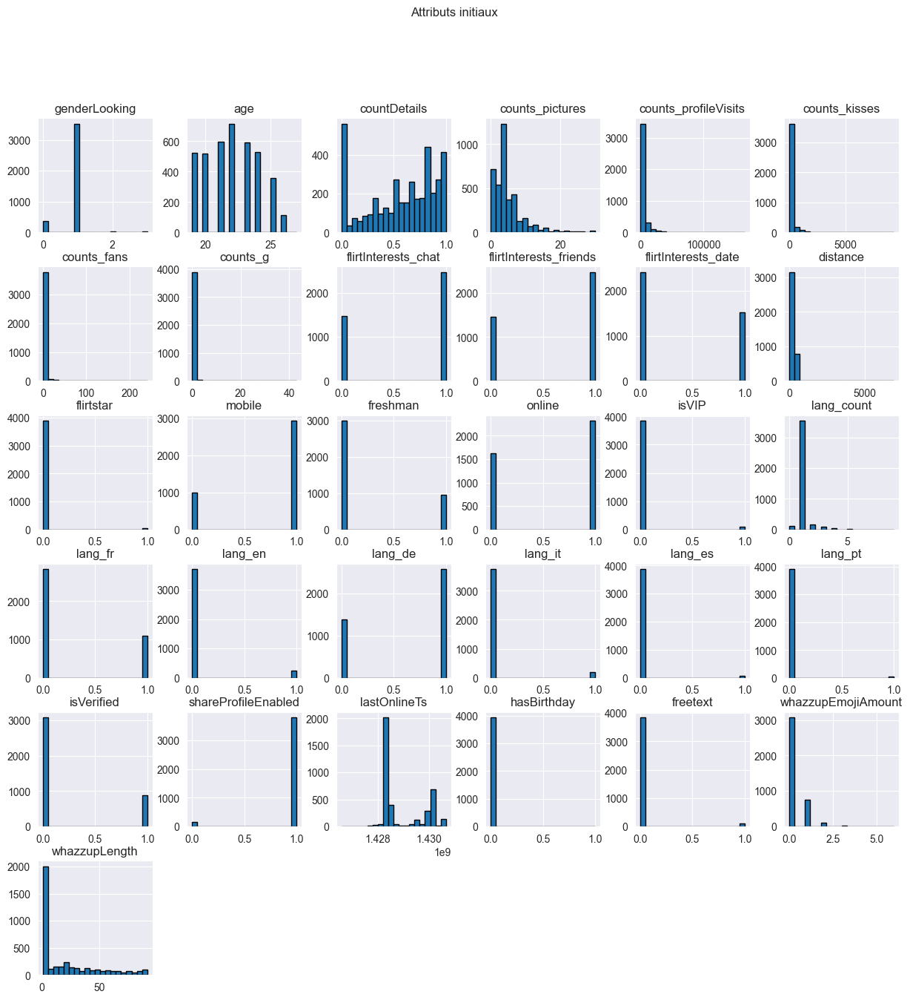

In [103]:
for col in dataset.columns:
    if dataset[col].dtype == 'object':
        try:
            dataset[col] = pd.to_numeric(dataset[col], errors='coerce')
        except ValueError:
            continue
#Affichage répartition des données
def printLabels(dataset, title):
    numeric_columns = dataset.select_dtypes(include=[np.number]).columns
    dataset_numeric = dataset[numeric_columns]
   
    dataset_numeric.hist(figsize=(15, 15), bins=20, edgecolor='black')
    plt.suptitle(title)
    plt.show()

printLabels(dataset.iloc[:, :-1], "Attributs initiaux")


Matrice de corrélation sous forme de heatmap


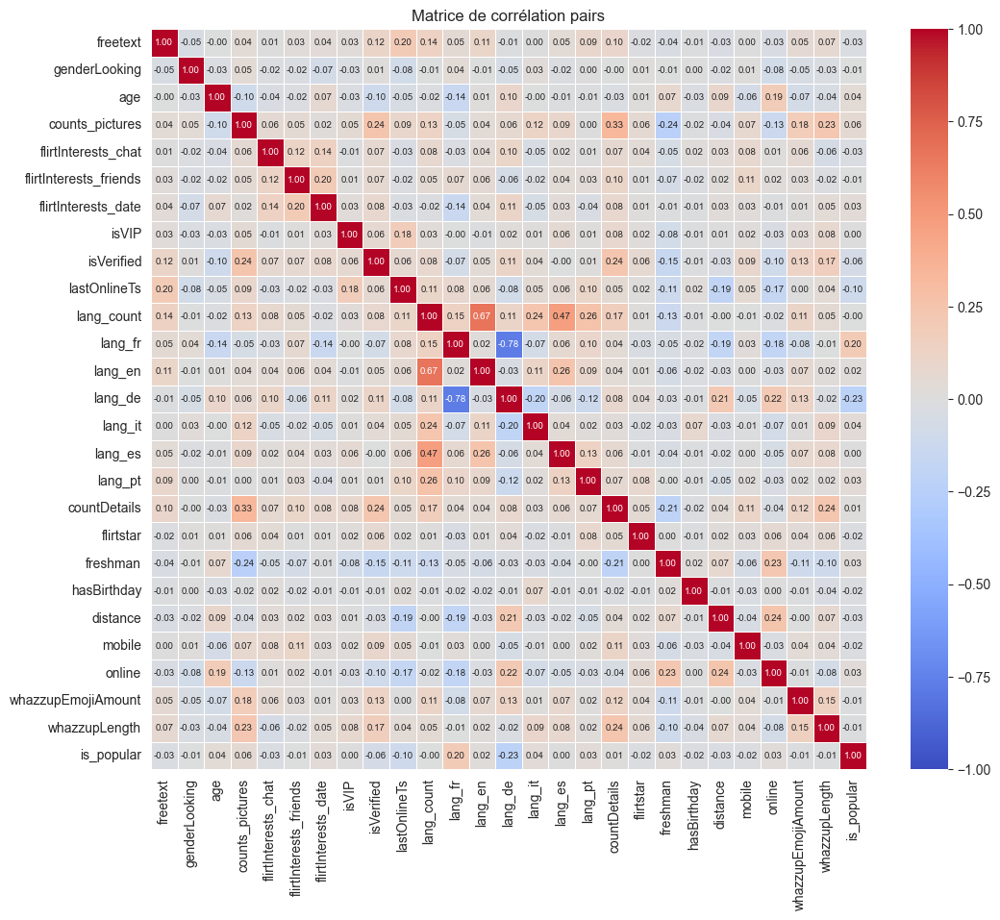


Matrice de corrélation sous forme de heatmap


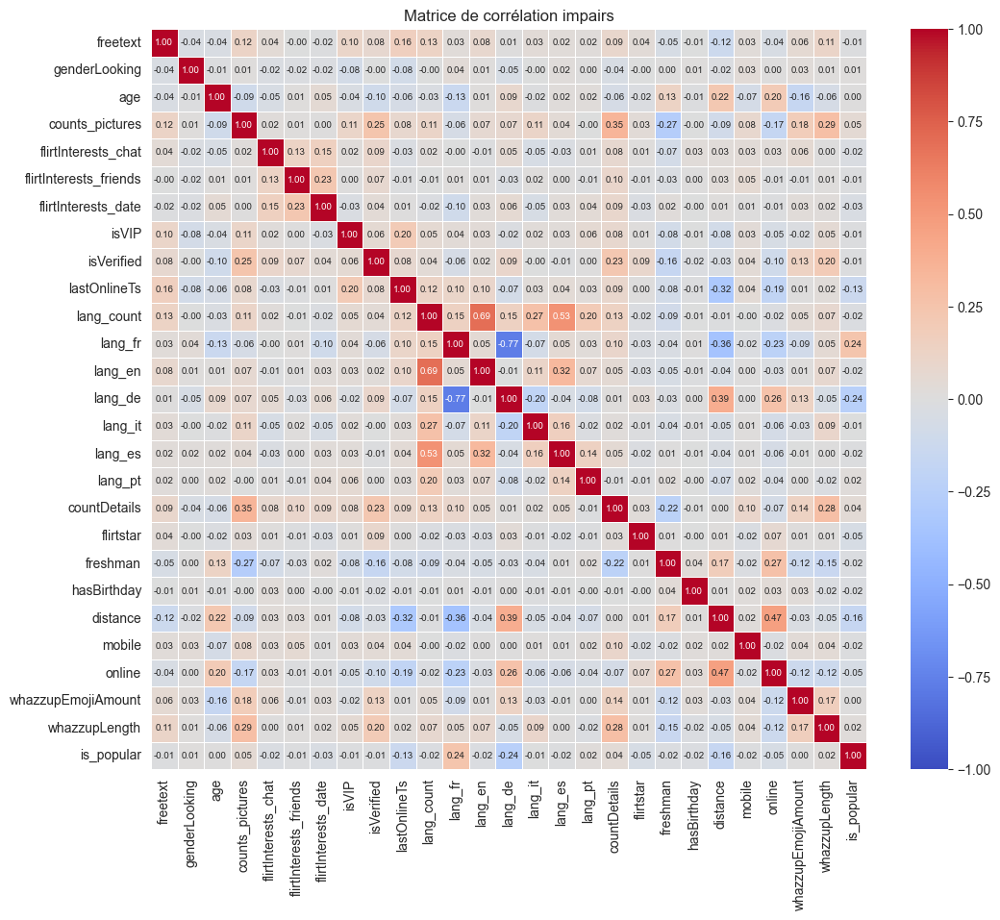


Matrice de corrélation sous forme de heatmap


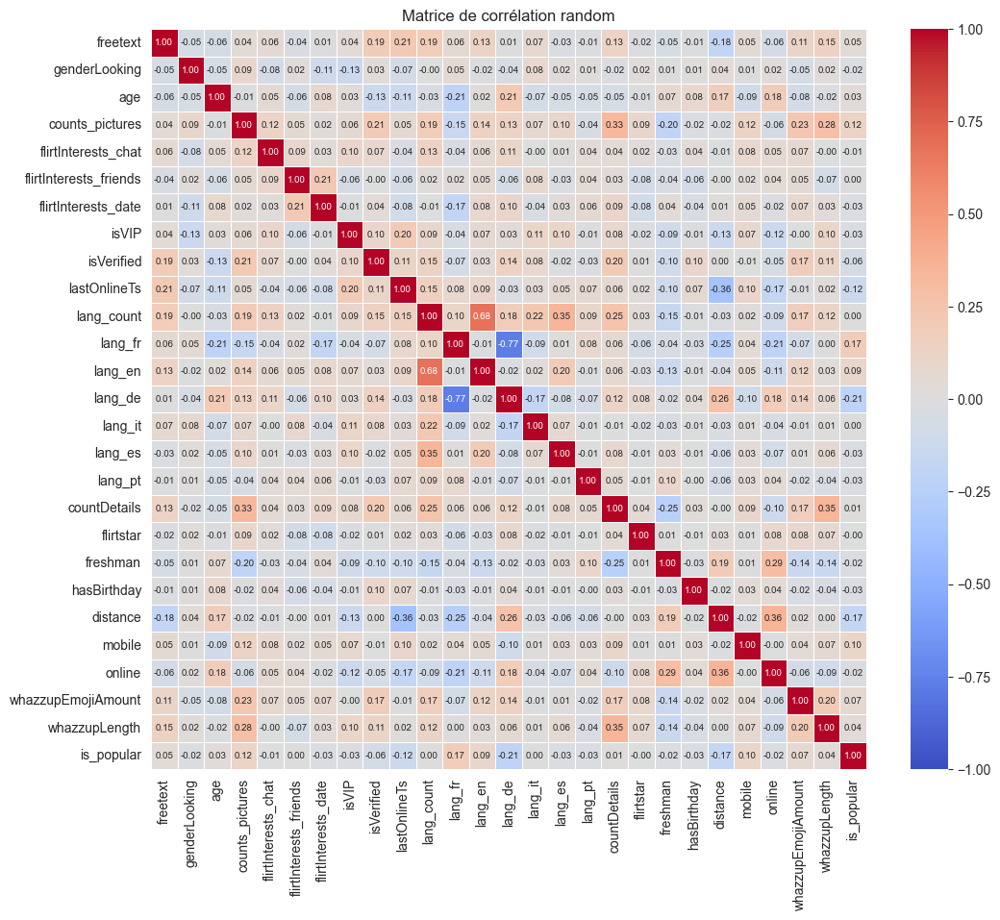


Matrice de corrélation sous forme de heatmap


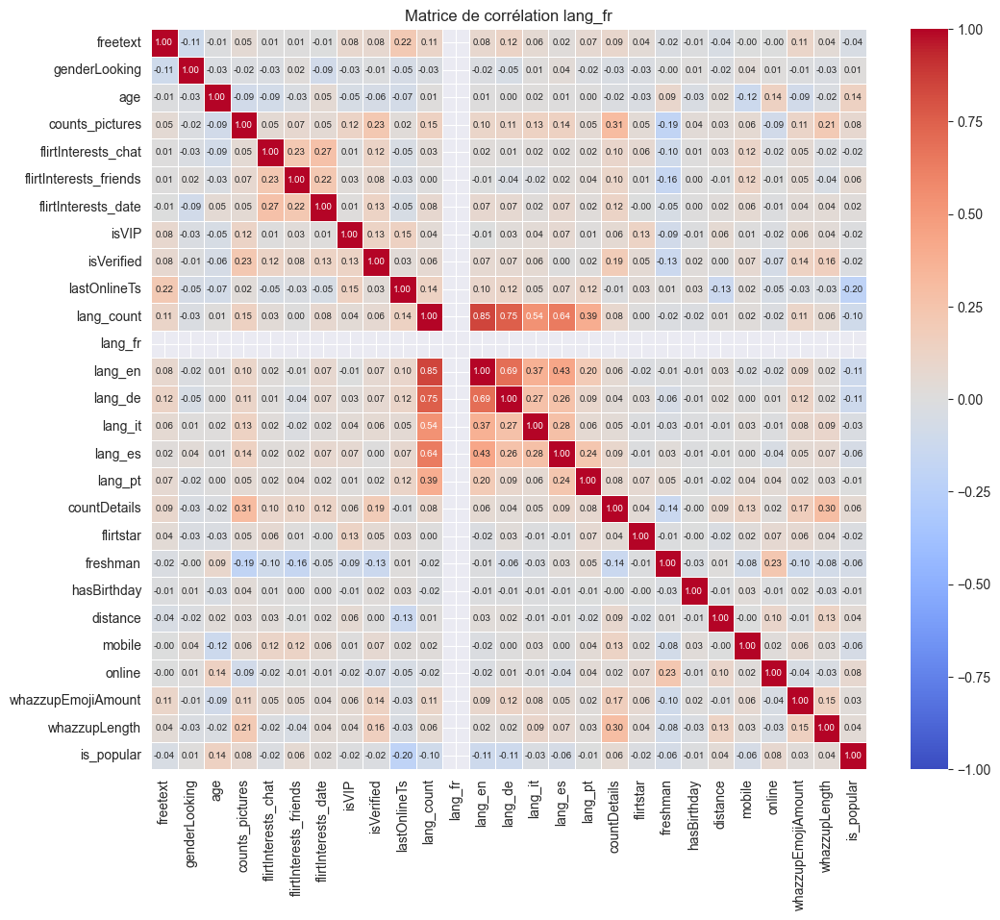


Matrice de corrélation sous forme de heatmap


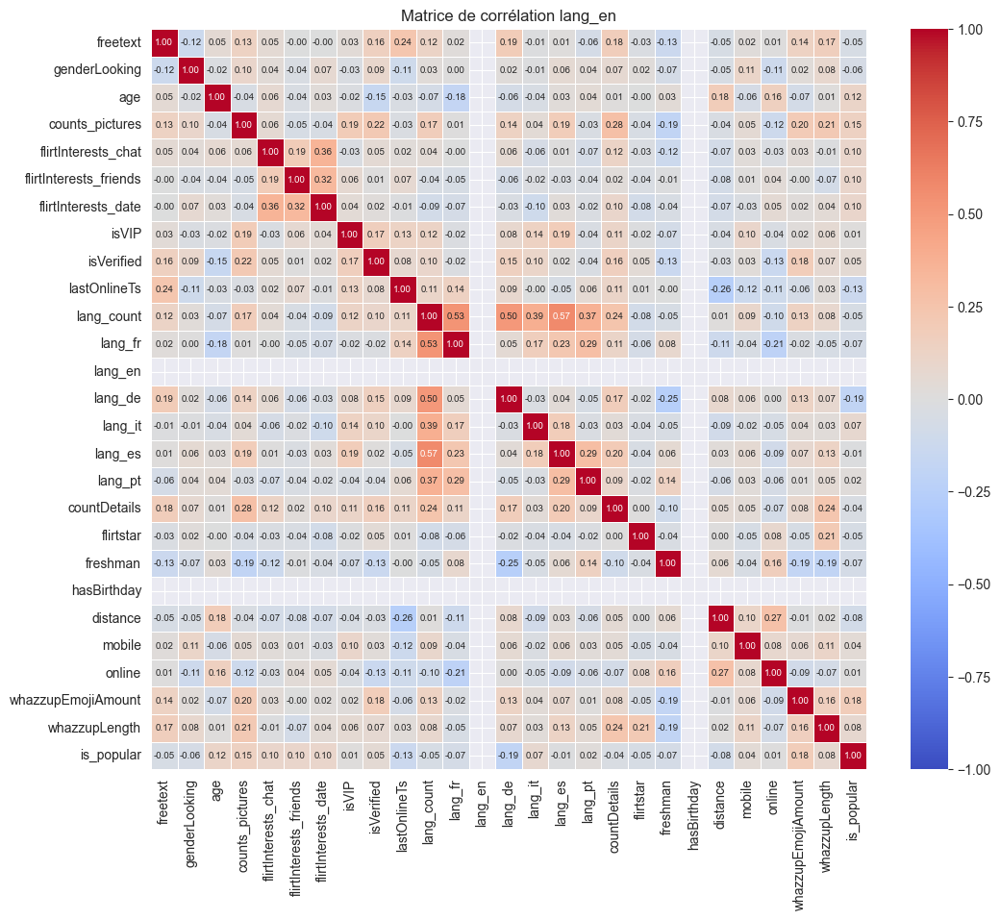


Matrice de corrélation sous forme de heatmap


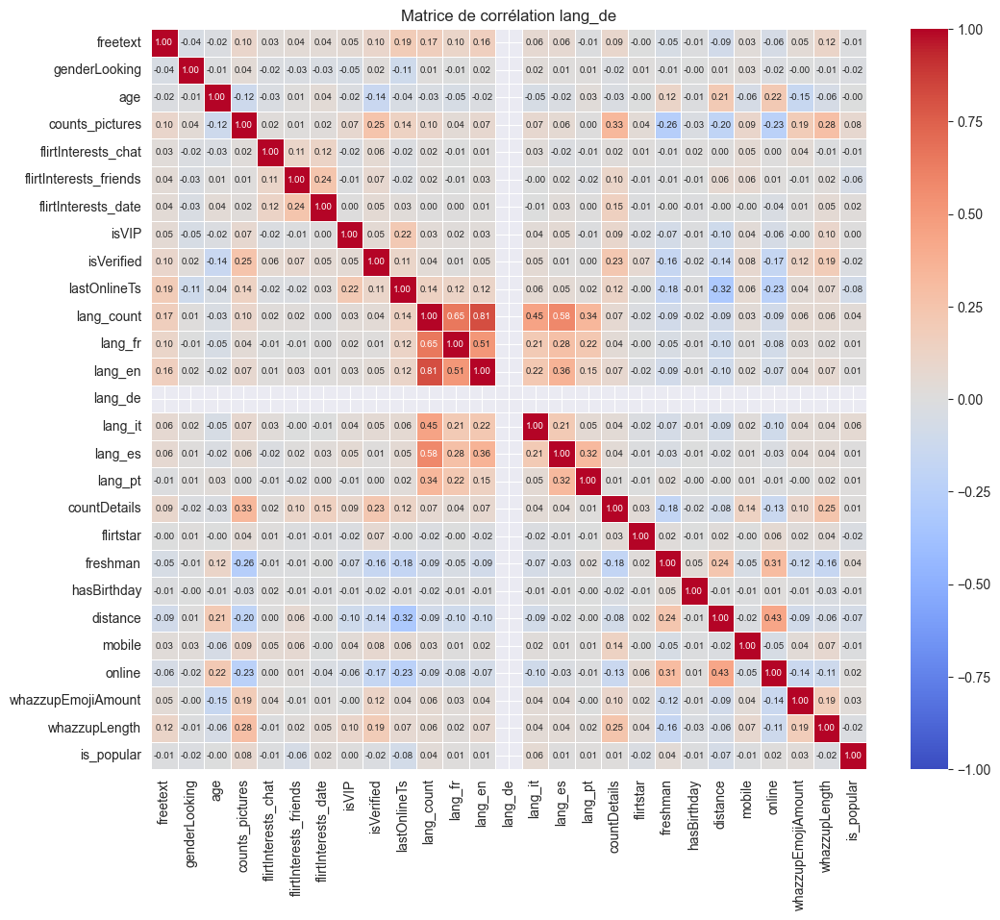


Matrice de corrélation sous forme de heatmap


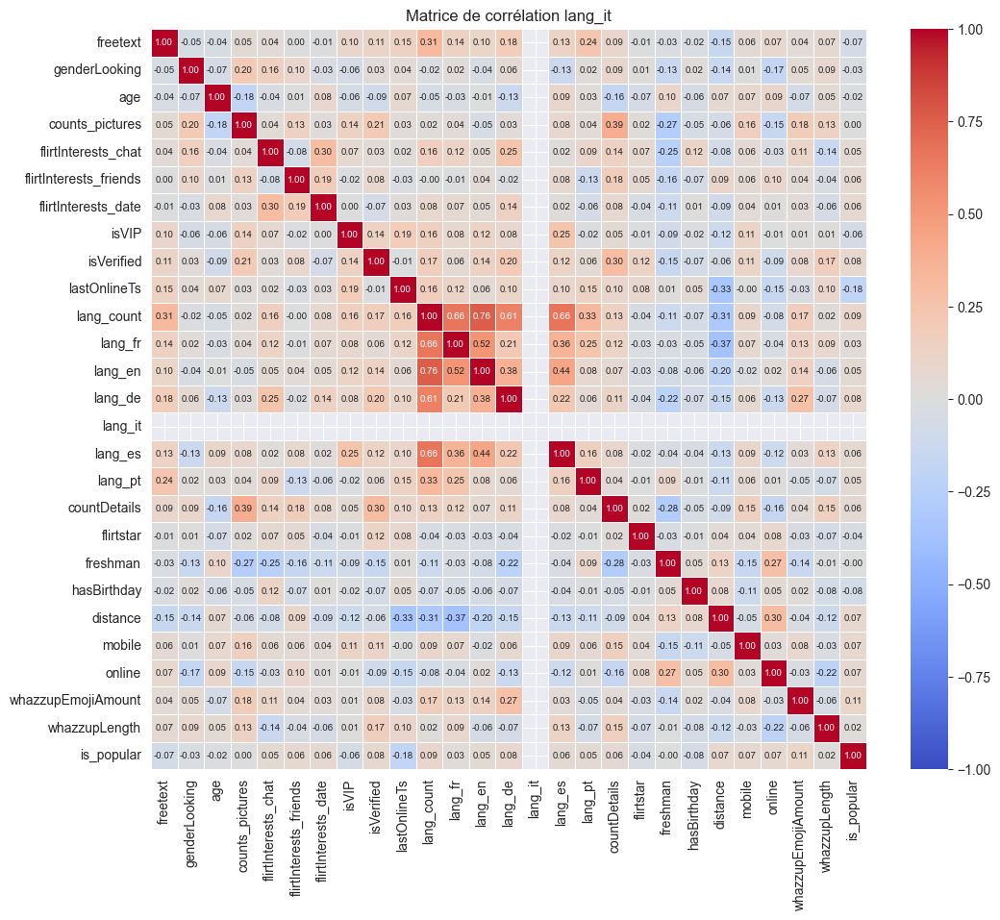


Matrice de corrélation sous forme de heatmap


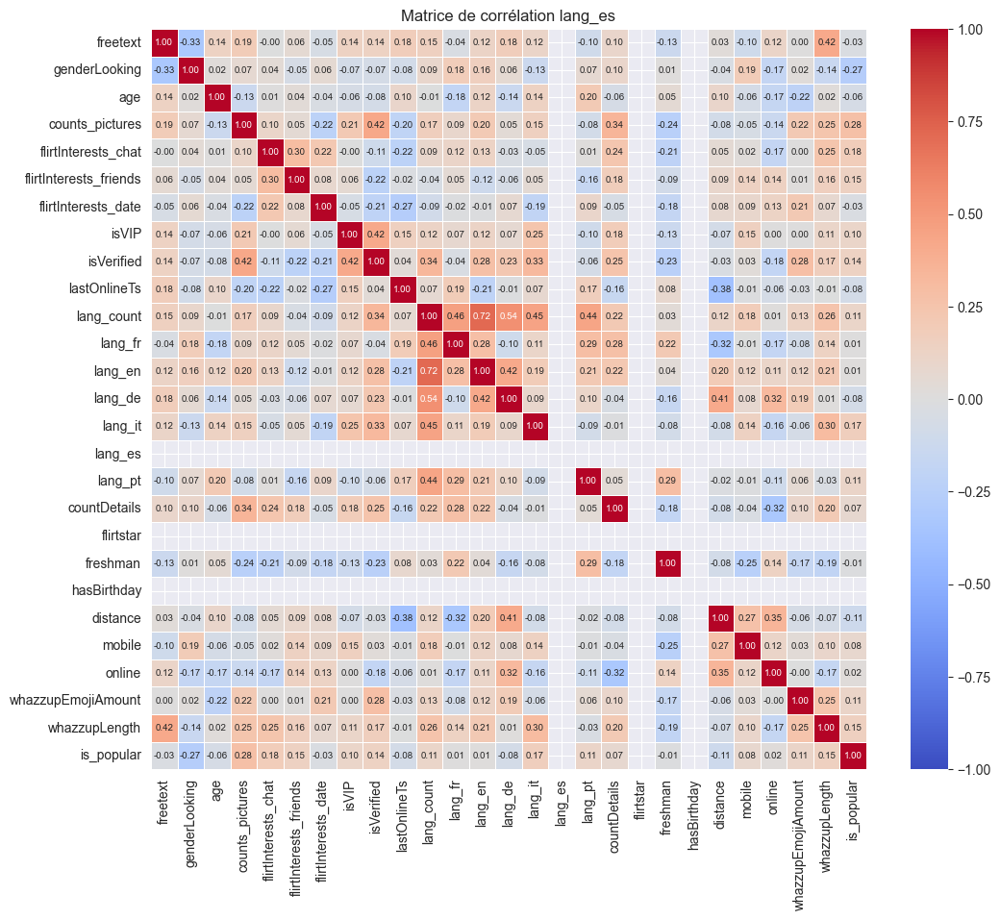


Matrice de corrélation sous forme de heatmap


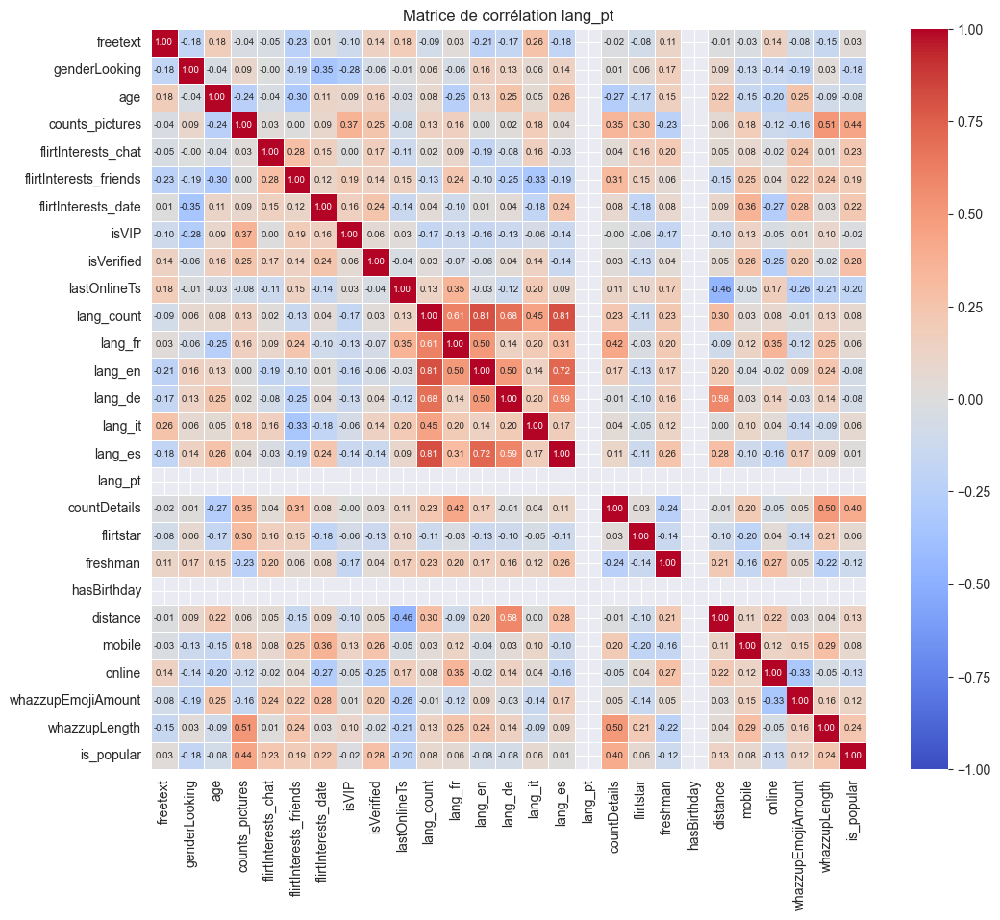


Matrice de corrélation sous forme de heatmap


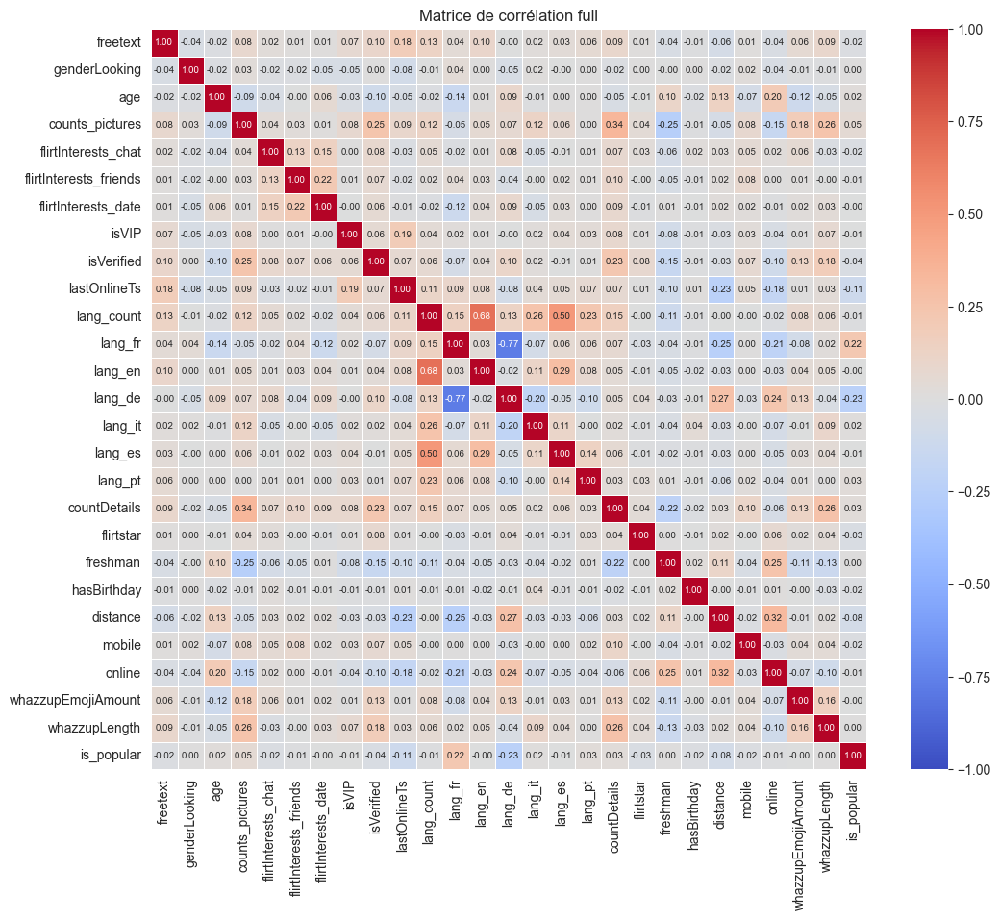

In [104]:

# Tableau de correlation
def numpyToDataframe(dataset):
  columnsNames=[
    'freetext',
    'genderLooking',
    'age', 
    'counts_pictures',  
    'flirtInterests_chat', 
    'flirtInterests_friends',
    'flirtInterests_date', 
    'isVIP', 
    'isVerified',
    'lastOnlineTs', 
    'lang_count', 
    'lang_fr', 
    'lang_en', 
    'lang_de',
    'lang_it', 
    'lang_es', 
    'lang_pt', 
    'countDetails', 
    'flirtstar',
    'freshman', 
    'hasBirthday', 
    'distance', 
    'mobile',
    'online', 
    'whazzupEmojiAmount', 
    'whazzupLength', 
    "is_popular"]
  #dataset = np.delete(dataset, 0, axis=1)
  df = pd.DataFrame(dataset, columns=columnsNames[:])# columns=columnsNames)
  return df

def printCorrelationHeatMap(df,titre):
  print("\nMatrice de corrélation sous forme de heatmap")
  plt.figure(figsize=(12, 10))
  correlation_matrix = df.corr()
  sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1, fmt='.2f', linewidths=.5, annot_kws={"size": 7})
  plt.title('Matrice de corrélation ' + titre)
  plt.show()
  
# Datamart lignes paires
datamart_pairs = dataset.iloc[::2].copy()
dataframe_pairs = numpyToDataframe(datamart_pairs) 
printCorrelationHeatMap(dataframe_pairs,"pairs")

# Datamart impaires 
datamart_impairs = dataset.iloc[1::2].copy()
dataframeImpairs = numpyToDataframe(datamart_impairs) 
printCorrelationHeatMap(dataframeImpairs,"impairs")

# Datamart aléatoire 10%
sample_fraction = 0.1  
datamart_random = dataset.sample(frac=sample_fraction, random_state=42).copy()
dataframe_random = numpyToDataframe(datamart_random) 
printCorrelationHeatMap(dataframe_random,"random")

# datamarts par langue
datamarts = {}
language_columns = ['lang_fr', 'lang_en', 'lang_de', 'lang_it', 'lang_es', 'lang_pt']
for lang in language_columns:
    if lang in dataset.columns:
        datamart_lang = dataset[dataset[lang] == 1].copy()
        datamarts[lang] = datamart_lang
for lang, dm in datamarts.items():
    dmr = numpyToDataframe(dm) 
    printCorrelationHeatMap(dmr,f"{lang}")

dataframe = numpyToDataframe(dataset) 
printCorrelationHeatMap(dataframe,"full")

Accuracy: 0.6717363751584284


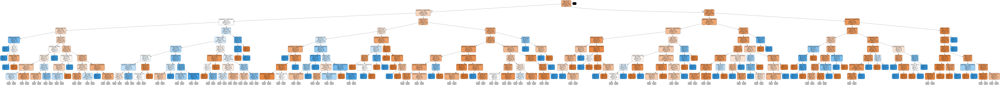

In [105]:


#Entrainement

X = dataset[features]
y = dataset['is_popular']
dataset.to_csv('IsPopular_data.csv', index=False, header=True)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

clf = DecisionTreeClassifier(random_state=42)
clf = clf.fit(X_train,y_train)
y_pred = clf.predict(X_test)

print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

dot_data = StringIO()
export_graphviz(clf, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,feature_names = features,class_names=['0','1'], max_depth=8)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('lovoo.png')

Image(graph.create_png())


Train score:  0.743581616481775
Test score:  0.7389100126742713


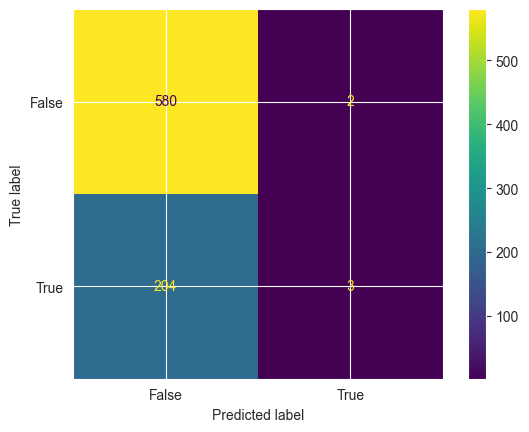

In [106]:




#Classificateur bayésien naif
# Fonction qui créer et entraine un classificateur bayésien naîf
def bayesianClass(X_train,Y_train):
  clf = GaussianNB()
  clf.fit(X_train, np.ravel(Y_train))
  return clf

# Fonction qui génére et affiche une matrice de confusion à partir des données 
# de validations
def confusionMatrixBC(bayesianClass,X_train,Y_train,X_test,Y_test):
  ConfusionMatrixDisplay.from_estimator(bayesianClass, X_test, Y_test)
  print("Train score: ", bayesianClass.score(X_train, Y_train))
  print("Test score: ", bayesianClass.score(X_test, Y_test))

bc_full = bayesianClass(X_train, y_train)
confusionMatrixBC(bc_full, X_train, y_train, X_test, y_test) 

#bc_clean = bayesianClass(X_CleanTrain, Y_CleanTrain)
#confusionMatrixBC(bc_clean, X_CleanTrain, Y_CleanTrain, X_CleanTest, Y_CleanTest)


k = 1


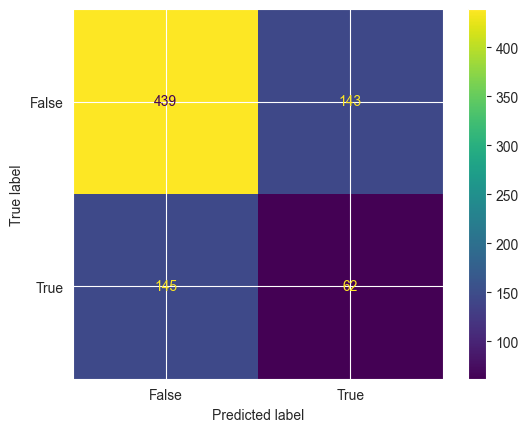

Train accuracy:  0.9736925515055468
Test Accuracy:  0.6349809885931559
k = 2


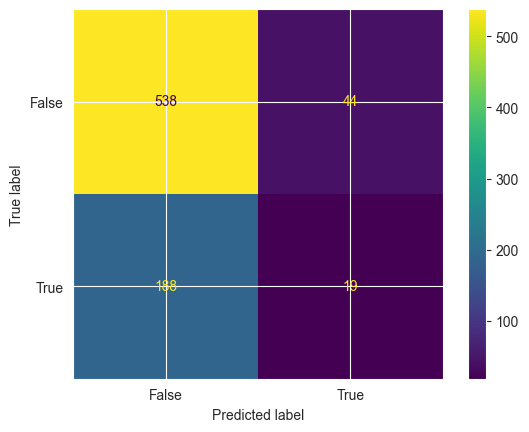

Train accuracy:  0.8206022187004754
Test Accuracy:  0.70595690747782
k = 3


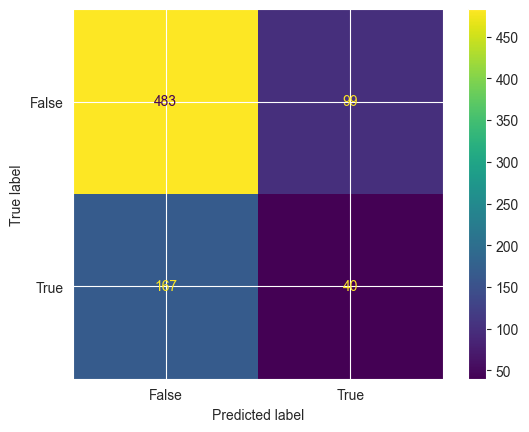

Train accuracy:  0.8282091917591126
Test Accuracy:  0.6628643852978454
k = 4


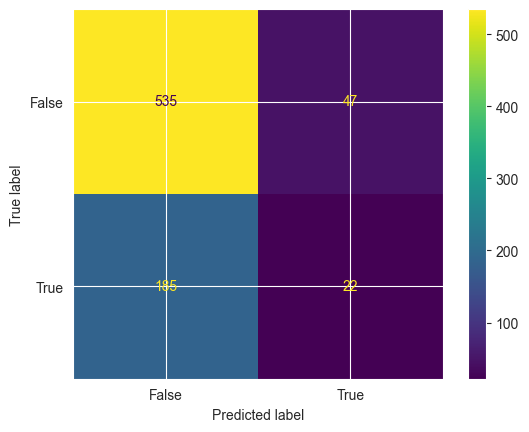

Train accuracy:  0.7882725832012678
Test Accuracy:  0.70595690747782
k = 5


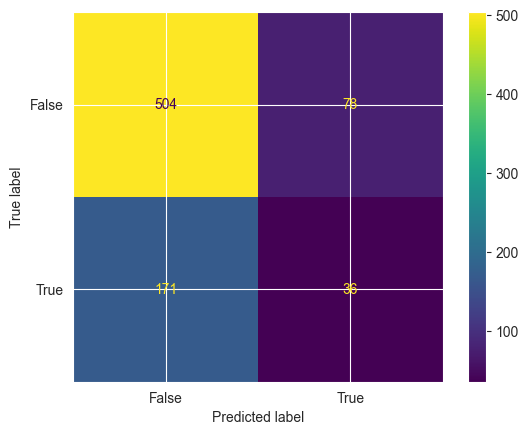

Train accuracy:  0.7892234548335975
Test Accuracy:  0.6844106463878327
k = 6


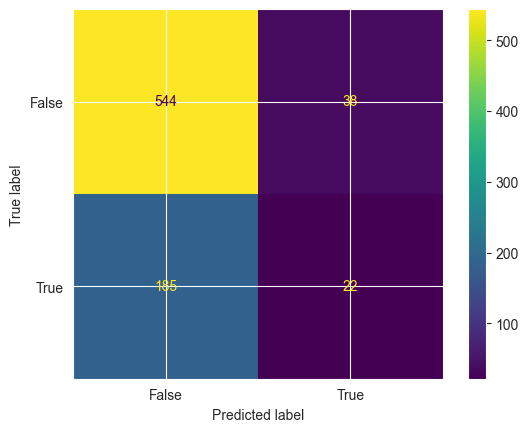

Train accuracy:  0.7717908082408875
Test Accuracy:  0.7173637515842839
k = 7


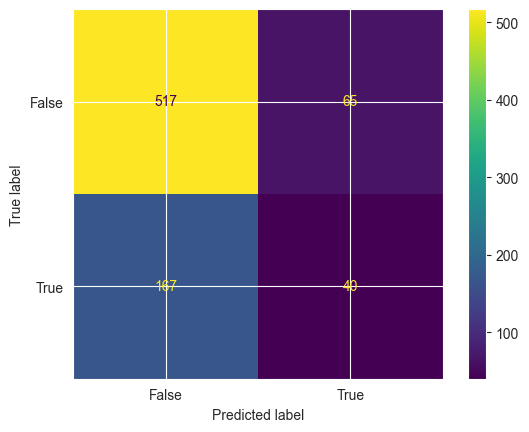

Train accuracy:  0.7667194928684627
Test Accuracy:  0.70595690747782
k = 8


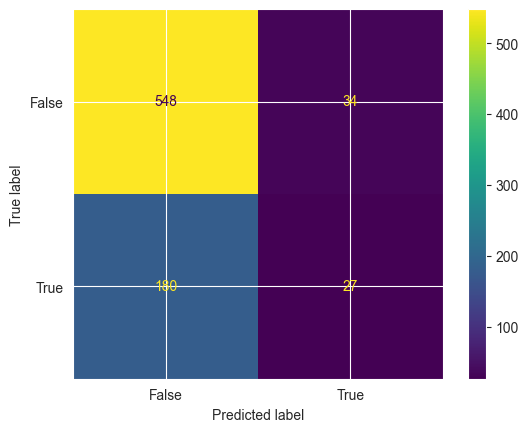

Train accuracy:  0.7645007923930269
Test Accuracy:  0.7287705956907478
k = 9


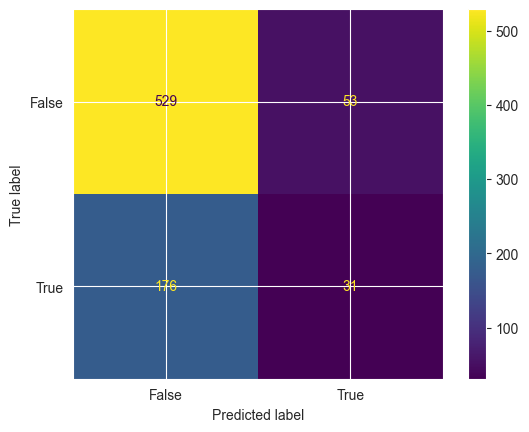

Train accuracy:  0.768621236133122
Test Accuracy:  0.7097591888466414


In [107]:





#Classificateur k-nn
# Fonction qui créer un classificateur k-nn
def knnClass(k,X_train,Y_train):
  clf = KNeighborsClassifier(n_neighbors=k)
  clf.fit(X_train, np.ravel(Y_train))
  return clf

# Fonction qui génére et affiche une matrice de confusion à partir des données 
# de validations
def confusionMatrixknn(knnClass,X_train,Y_train,X_test,Y_test):
  ConfusionMatrixDisplay.from_estimator(knnClass, X_test, Y_test)
  plt.show()
  print("Train accuracy: ", knnClass.score(X_train, Y_train))
  print("Test Accuracy: ", knnClass.score(X_test, Y_test))

for i in range(1,10):
  glassknn = knnClass(i,X_train, y_train)
  print(f"k = {i}")
  confusionMatrixknn(glassknn,X_train, y_train, X_test, y_test) 
